In [1]:
import matplotlib.pyplot as plt
import torch
import numpy as np
import torchvision
import os
from tqdm.auto import tqdm
from fff.evaluate.fid import compute_fid_openai_tf as compute_fid
from fff.evaluate.fid_old import compute_fid as compute_fid_alternative
import matplotlib as mpl

mpl.rcParams["mathtext.fontset"] = "stix"

device = "cuda" if torch.cuda.is_available() else "cpu"

/home/hd/hd_hd/hd_gu452/miniconda3/envs/pytorch/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
INFO: Using pytorch backend
2026-01-11 14:35:43.189914: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
@torch.no_grad()
def find_nearest_neighbor(image_embeddings, original_embeddings, identity_threshold=1.e-4):
    distance_matrix = torch.mean((image_embeddings[None, ...] - original_embeddings[:, None, ...]) ** 2, dim=(-1))
    distance_matrix[distance_matrix < identity_threshold] = torch.inf
    return torch.argmin(distance_matrix, dim=0)

In [3]:
@torch.no_grad()
def find_nearest_neighbor_batched_mm(
    image_embeddings: torch.Tensor,
    original_embeddings: torch.Tensor,
    identity_threshold: float = 1e-4,
    batch_size: int = 1024,
):
    """
    Memory-efficient nearest neighbor search using matrix multiplication.

    Args:
        image_embeddings:    (N_img, D)
        original_embeddings: (N_orig, D)
        identity_threshold:  distances below this are ignored
        batch_size:          number of originals per chunk

    Returns:
        indices: (N_img,) nearest original index per image
    """
    device = image_embeddings.device
    N_img, D = image_embeddings.shape
    N_orig = original_embeddings.shape[0]

    # Precompute norms
    img_norms = (image_embeddings ** 2).mean(dim=1)        # (N_img,)
    best_dist = torch.full((N_img,), torch.inf, device=device)
    best_idx = torch.full((N_img,), -1, dtype=torch.long, device=device)

    for start in range(0, N_orig, batch_size):
        end = min(start + batch_size, N_orig)
        orig_chunk = original_embeddings[start:end]         # (B, D)

        # (B,)
        orig_norms = (orig_chunk ** 2).mean(dim=1)

        # (B, N_img)
        cross = orig_chunk @ image_embeddings.T             # dot products
        dist = (
            orig_norms[:, None]
            + img_norms[None, :]
            - 2 * cross / D
        )

        # Ignore identical embeddings
        dist[dist < identity_threshold] = torch.inf

        # Best match in this chunk
        chunk_min_dist, chunk_min_idx = torch.min(dist, dim=0)

        # Update global best
        update = chunk_min_dist < best_dist
        best_dist[update] = chunk_min_dist[update]
        best_idx[update] = chunk_min_idx[update] + start

    return best_idx


In [4]:
def masked_mean(x, mask, dim):
    mask = mask.float().to(x.device)
    return (x * mask).sum(dim) / mask.sum(dim).clamp(min=1)

In [5]:
def combine_and_save_imagenet_samples(prefix_filter="sampled_imagenet_invariances_", save_name="sampled_imagenet_invariances.pt"):
    combined_dict = {
        "invariances": [],
        "originals": [],
        "labels": [],
        "invariances_embeddings": [],
        "original_embeddings": [],
    }
    
    for foldername in tqdm(os.listdir("/home/hd/hd_hd/hd_gu452/workspaces/gpfs/hd_gu452-imagenet")):
        if foldername.startswith(prefix_filter):
            results_dict = {
                            "invariances": [],
                            "originals": [],
                            "labels": [],
                            "invariances_embeddings": [],
                            "original_embeddings": [],
                           }
            chunk_id = 0
            while os.path.exists(os.path.join(foldername, f"chunk_{chunk_id}.pt")):
                chunk_dict = torch.load(os.path.join(foldername, f"chunk_{chunk_id}.pt"))
                for key in results_dict.keys():
                    results_dict[key].append(chunk_dict[key])
                chunk_id += 1
            for key in results_dict.keys():
                combined_dict[key].append(torch.cat(results_dict[key], dim=0))
    
    # Check consistency:
    for last_orig, next_orig in zip(combined_dict["originals"][:-1], combined_dict["originals"][1:]):
        min_len = min(len(last_orig), len(next_orig))
        assert torch.all(((last_orig[:min_len] - next_orig[:min_len])**2).sum(dim=-1) < 1.e-4), "Dataset order does not agree"
    
    max_len, ind_max = 0, None
    for i, orig in enumerate(combined_dict["originals"]):
        if len(orig) > max_len:
            ind_max = i
            max_len = len(orig)
    
    combined_dict["originals"] = combined_dict["originals"][ind_max]
    combined_dict["original_embeddings"] = combined_dict["original_embeddings"][ind_max]
    combined_dict["labels"] = combined_dict["labels"][ind_max]
    
    assert len(combined_dict["originals"]) == len(combined_dict["original_embeddings"]) == len(combined_dict["labels"])
    
    combined_dict["masks"] = []
    for i, (inv, inv_embeddings) in enumerate(zip(combined_dict["invariances"], combined_dict["invariances_embeddings"])):
        assert len(inv) == len(inv_embeddings)
        mask = torch.cat((torch.ones(len(inv), device=inv.device, dtype=bool), 
                          torch.zeros(max_len - len(inv), device=inv.device, dtype=bool)), dim=0)
        inv = torch.cat((inv, torch.zeros(max_len - len(inv), *inv.shape[1:], device=inv.device, dtype=inv.dtype)), dim=0)
        inv_embeddings = torch.cat((inv_embeddings, torch.zeros(max_len - len(inv_embeddings), *inv_embeddings.shape[1:], device=inv_embeddings.device, dtype=inv_embeddings.dtype)), dim=0)
        combined_dict["invariances"][i] = inv
        combined_dict["invariances_embeddings"][i] = inv_embeddings
        combined_dict["masks"].append(mask)
    
    combined_dict["invariances"] = torch.stack(combined_dict["invariances"], dim=1)
    combined_dict["invariances_embeddings"] = torch.stack(combined_dict["invariances_embeddings"], dim=1)
    combined_dict["masks"] = torch.stack(combined_dict["masks"], dim=1)
    
    torch.save(combined_dict, save_name)

# ImageNet Originals

In [19]:
combine_and_save_imagenet_samples(prefix_filter="sampled_imagenet_invariances_", save_name="sampled_imagenet_invariances.pt")

100%|██████████| 30/30 [00:48<00:00,  1.62s/it]


In [20]:
inv_dict = torch.load("sampled_imagenet_invariances.pt")

In [21]:
orig, inv, mask = inv_dict["originals"], inv_dict["invariances"], inv_dict["masks"]
# orig, inv = inv_dict["originals"], inv_dict["invariances"]
# inv_dict["masks"] = mask = torch.ones(len(inv), device=inv.device, dtype=bool).unsqueeze(1)
# inv = inv.unsqueeze(1)
nn_indices = find_nearest_neighbor_batched_mm(inv_dict["original_embeddings"], inv_dict["original_embeddings"])

In [22]:
with torch.no_grad():
    fiber_loss_invariances = ((inv_dict["original_embeddings"][:,None,...] - inv_dict["invariances_embeddings"])**2).sum(dim=-1)
    fiber_loss_nearest_neighbors = ((inv_dict["original_embeddings"] - inv_dict["original_embeddings"][nn_indices])**2).sum(dim=-1)
    mean_fiber_loss_invariances = masked_mean(fiber_loss_invariances, inv_dict["masks"], 0)
    print(f"Fiber loss invariances: {mean_fiber_loss_invariances.mean()} +- {mean_fiber_loss_invariances.std()}\nFiber loss nearest neighbors: {fiber_loss_nearest_neighbors.mean()}")


Fiber loss invariances: 272.7218322753906 +- 4.0614399909973145
Fiber loss nearest neighbors: 2685.77685546875


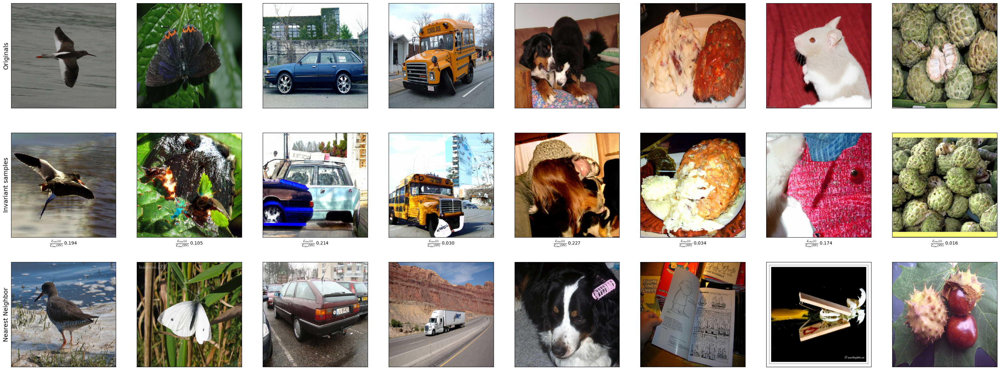

In [10]:
plt_nn = True
num_samples = 8
plot_indices = torch.randperm(len(orig))[:num_samples]
plots_per_col = 2 + plt_nn
plt.figure(figsize=(5*num_samples, 5*plots_per_col))

for i, ind in enumerate(plot_indices): 
    plt.subplot(plots_per_col, num_samples, i+1)
    plt.imshow(orig[ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel("Originals", fontsize=14)
    plt.subplot(plots_per_col, num_samples, i+1+num_samples)
    min_fl_ind = torch.argmin(fiber_loss_invariances[ind] + ~mask[ind].to(fiber_loss_invariances.device)*torch.inf, dim=0)
    plt.imshow(inv[ind, min_fl_ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(r"$\frac{\mathcal{L}_\text{fiber}(x)}{\mathcal{L}_\text{fiber}(NN)}$ %.3f" % (fiber_loss_invariances[ind][min_fl_ind]/fiber_loss_nearest_neighbors[ind], ))
    if i == 0:
        plt.ylabel("Invariant samples", fontsize=14)
    if plt_nn:
        plt.subplot(plots_per_col, num_samples, i+1+2*num_samples)
        plt.imshow(orig[nn_indices[ind]].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
        plt.xticks([])
        plt.yticks([])
        # plt.xlabel(r"$\mathcal{L}_\text{fiber}$ %.1f" % (fiber_loss_nearest_neighbors[ind], ))
        if i == 0:
            plt.ylabel("Nearest Neighbor", fontsize=14)
plt.show()

In [11]:
fids = []
for i in range(inv_dict["invariances"].shape[1]):
    fid = compute_fid(inv_dict["originals"][inv_dict["masks"][:, i]].to(device), inv_dict["invariances"][:, i][inv_dict["masks"][:, i]].to(device))
    fids.append(fid)

2026-01-05 10:57:53.426280: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2026-01-05 10:57:53.451466: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2026-01-05 10:57:53.655057: W tensorflow/core/framework/op_def_util.cc:369] Op BatchNormWithGlobalNormalization is deprecated. It will cease to work in GraphDef version 9. Use tf.nn.batch_normalization().
100%|██

In [12]:
print(f"FID of invariant samples is {np.mean(fids)} +- {np.std(fids)}")

FID of invariant samples is 106.68576230473518 +- 1.4408679924457422


In [13]:
len(inv_dict["originals"])

540

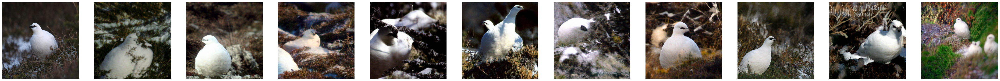

In [13]:
img_index = 9
num_inv_to_show = min(10, inv_dict["masks"][img_index].sum().item())
show_orig = True
plt.figure(figsize=(5*(num_inv_to_show+show_orig), 5))
save_samples = False


if show_orig:
    plt.subplot(1, num_inv_to_show+show_orig, 1)
    plt.imshow(inv_dict["originals"][img_index].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.axis("off")

current_sample_set = 0

for i in range(num_inv_to_show):
    while not inv_dict["masks"][img_index][current_sample_set]:
        current_sample_set += 1
        if current_sample_set >= inv_dict["masks"].shape[1]:
            raise(RuntimeError("Error computing the maximum number of samples to show"))
        
    plt.subplot(1, num_inv_to_show+show_orig, i+1+show_orig)
    plt.imshow(inv_dict["invariances"][img_index, current_sample_set].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.axis("off")
    current_sample_set += 1
plt.show()

if save_samples:
    plt.figure(figsize=(5, 5))
    plt.imshow(inv_dict["originals"][img_index].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.axis("off")
    plt.savefig("PaperSamples/ImageNetOriginal.pdf", bbox_inches="tight")
    
    current_sample_set = 0
    
    for i in range(num_inv_to_show):
        while not inv_dict["masks"][img_index][current_sample_set]:
            current_sample_set += 1
            if current_sample_set >= inv_dict["masks"].shape[1]:
                raise(RuntimeError("Error computing the maximum number of samples to show"))
        plt.imshow(inv_dict["invariances"][img_index, current_sample_set].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
        plt.axis("off")
        current_sample_set += 1
        plt.savefig(f"PaperSamples/ImageNetInvariantSample_{i+1}.pdf", bbox_inches="tight")


In [14]:
pretrained_classifier = torchvision.models.convnext_large(weights=torchvision.models.ConvNeXt_Large_Weights.IMAGENET1K_V1).to(device)

@torch.no_grad()
def get_logits(pretrained_classifier, inputs, batch_size):
    dl = torch.utils.data.DataLoader(inputs, batch_size=batch_size, drop_last=False, shuffle=False)
    logits = []
    for batch in dl:
        logits.append(pretrained_classifier(batch))
    return torch.cat(logits, dim=0)

@torch.no_grad()
def get_labels(pretrained_classifier, inputs, batch_size):
    logits = get_logits(pretrained_classifier, inputs, batch_size)
    return torch.argmax(logits, dim=1)

@torch.no_grad()
def label_in_top_k(labels, logits, k=5):
    topk_indices = logits.topk(k, dim=1).indices

    labels = labels.unsqueeze(1)
    in_top_k = (topk_indices == labels).any(dim=1)
    return in_top_k

logits_orig = get_logits(pretrained_classifier, inv_dict["originals"], batch_size=512)
recomputed_labels = torch.argmax(logits_orig, dim=1)
classifer_top_k = label_in_top_k(inv_dict["labels"].to(device), logits_orig)

logits_inv = []
recomputed_in_top_k = []
gt_in_top_k = []

for i in tqdm(range(inv_dict["masks"].shape[1]), desc="Computing invariance logits"):
    mask, inv = inv_dict["masks"][:,i], inv_dict["invariances"][:,i]
    logits_inv.append(get_logits(pretrained_classifier, inv[mask].to(device), batch_size=512))
    recomputed_in_top_k.append(label_in_top_k(recomputed_labels[mask], logits_inv[-1]))
    gt_in_top_k.append(label_in_top_k(inv_dict["labels"][mask].to(device), logits_inv[-1]))


Computing invariance logits: 100%|██████████| 10/10 [00:19<00:00,  1.95s/it]


In [15]:
top_k_acc = classifer_top_k.float().mean().item()
top_k_acc_inv = [sample_set.float().mean().item() for sample_set in gt_in_top_k]
top_k_recomputed_acc_inv = [sample_set.float().mean().item() for sample_set in recomputed_in_top_k]

print(f"Top K accuracy of classifier on originals: {np.mean(top_k_acc)*100:.2f}%")
print(f"Top K accuracy of classifier on invariances: {np.mean(top_k_acc_inv)*100:.2f}% +- {np.std(top_k_acc_inv)*100:.2f}")
print(f"Top K accuracy of classifier on invariances, using label classifier predict on gt: {np.mean(top_k_recomputed_acc_inv)*100:.2f}% +- {np.std(top_k_recomputed_acc_inv)*100:.2f}")

Top K accuracy of classifier on originals: 94.67%
Top K accuracy of classifier on invariances: 77.19% +- 2.06
Top K accuracy of classifier on invariances, using label classifier predict on gt: 77.63% +- 1.98


## Unconditional Samples

In [6]:
combine_and_save_imagenet_samples(prefix_filter="sampled_imagenet_unconditional_", save_name="sampled_imagenet_unconditional.pt")

100%|██████████| 30/30 [00:00<00:00, 42.51it/s]


In [5]:
unconditional_samples_dict = torch.load("sampled_imagenet_unconditional.pt")

In [16]:
fids_unconditional = []
for i in range(unconditional_samples_dict["invariances"].shape[1]):
    inv, mask = unconditional_samples_dict["invariances"][:, i], unconditional_samples_dict["masks"][:, i]
    inv = torch.clamp(inv, -1, 1)
    fid = compute_fid(unconditional_samples_dict["originals"][:][mask].to(device), inv[mask].to(device))
    fids_unconditional.append(fid)

I0000 00:00:1767611531.930816 2972674 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 39828 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:01:00.0, compute capability: 8.6
100%|██████████| 11/11 [00:00<00:00, 12.56it/s]


In [17]:
print(f"FID of unconditional samples is {np.mean(fids_unconditional)} +- {np.std(fids_unconditional)}")

FID of unconditional samples is 104.65021794649948 +- 0.0


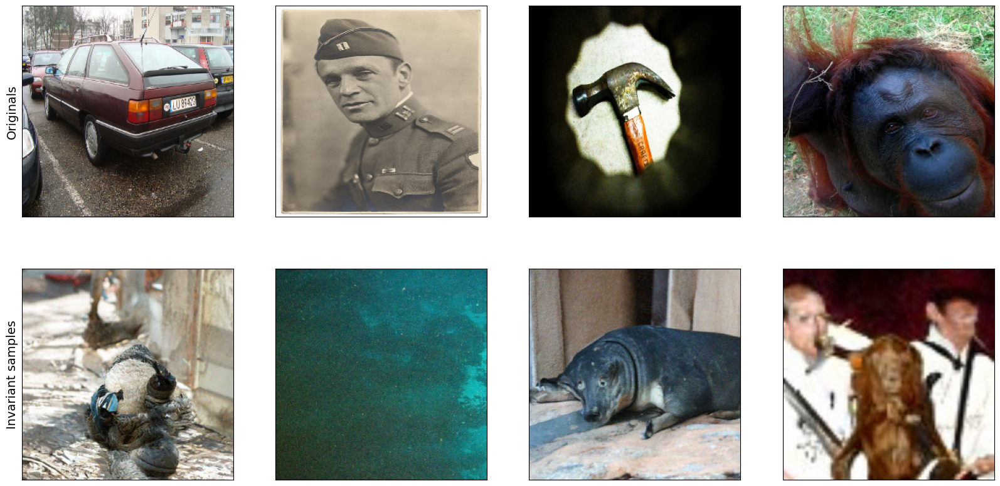

In [7]:
inv, mask = unconditional_samples_dict["invariances"][:, 0], unconditional_samples_dict["masks"][:, 0]
orig = unconditional_samples_dict["originals"][mask]
num_samples = 4
mask_indices = torch.randperm(mask.sum())[:num_samples]
plot_indices = torch.where(torch.logical_and(torch.sum(mask.cumsum(dim=0).unsqueeze(1) - 1 == mask_indices.unsqueeze(0), dim=1), mask))[0]
plots_per_col = 2 
plt.figure(figsize=(5*num_samples, 5*plots_per_col))

for i, ind in enumerate(plot_indices):
    plt.subplot(plots_per_col, num_samples, i+1)
    plt.imshow(orig[ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel("Originals", fontsize=14)
    plt.subplot(plots_per_col, num_samples, i+1+num_samples)
    plt.imshow(inv[ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel("Invariant samples", fontsize=14)
plt.show()

## Sanity Check

In [13]:
from fff.data import load_dataset

data_set_config = {
    "name": "imagenet",
    "root": "/home/hd/hd_hd/hd_gu452/FFF_fiberlearning/data",
    "resize_to": 256,
    "normalize": True,
}

ds_np = np.load("precomputed_unconditional_samples.npz")["arr_0"]
ds_torch = (torch.from_numpy(ds_np).permute(0, 3, 1, 2)/255)*2 - 1
_, val_ds, _ = load_dataset(**data_set_config)
dataloader = torch.utils.data.DataLoader(val_ds, batch_size=10, shuffle=True)
ref_labels = iter(dataloader).__next__()[1]
print(ref_labels)

tensor([119, 706, 689, 907, 767, 103, 437, 402, 241, 677])


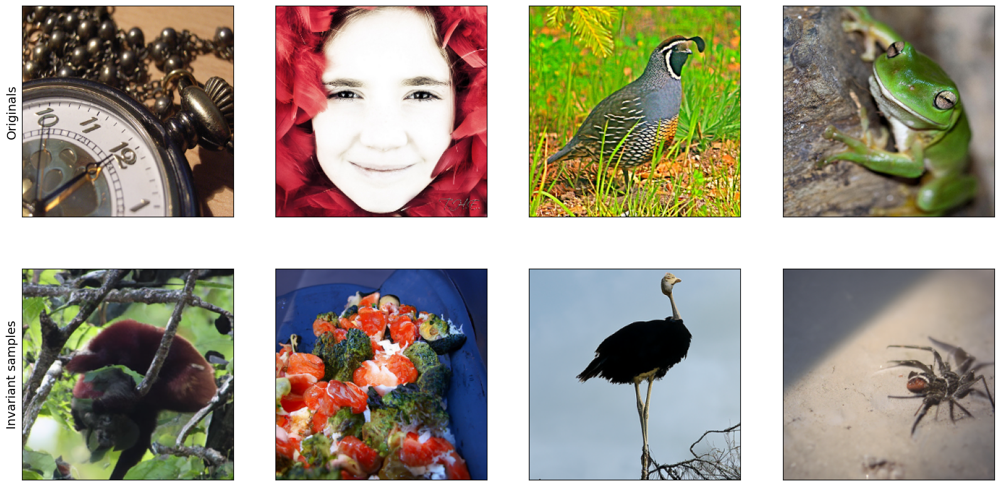

In [16]:

num_samples = 4
plot_indices = torch.randperm(len(ds_torch))[:num_samples]
plots_per_col = 2 
plt.figure(figsize=(5*num_samples, 5*plots_per_col))

for i, ind in enumerate(plot_indices):
    plt.subplot(plots_per_col, num_samples, i+1)
    plt.imshow(ref_samples[ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel("Originals", fontsize=14)
    plt.subplot(plots_per_col, num_samples, i+1+num_samples)
    plt.imshow(ds_torch[ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel("Invariant samples", fontsize=14)
plt.show()

In [17]:
fid = compute_fid(ds_torch, ref_samples)
print(fid)

2025-12-25 17:53:44.138102: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2025-12-25 17:53:44.264923: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2025-12-25 17:53:44.442772: W tensorflow/core/framework/op_def_util.cc:369] Op BatchNormWithGlobalNormalization is deprecated. It will cease to work in GraphDef version 9. Use tf.nn.batch_normalization().
100%|██

234.34034244538097


# Cue Conflict

In [23]:
def combine_and_save_cue_conflict_samples(prefix_filter="sampled_cue_conflict_invariances_", save_name="sampled_cue_conflict_invariances.pt"):
    combined_dict = {
        "invariances_dino": [],
        "invariances_resnet": [],
        "originals": [],
        "shape_labels": [],
        "texture_labels": [],
        "invariances_dino_embeddings": [],
        "invariances_resnet_embeddings": [],
        "original_dino_embeddings": [],
        "original_resnet_embeddings": [],
        "invariances_dino_cross_embeddings": [],
        "invariances_resnet_cross_embeddings": [],
    }

    for foldername in tqdm(os.listdir(".")):
        if foldername.startswith(prefix_filter):
            results_dict = {
                "invariances_dino": [],
                "invariances_resnet": [],
                "originals": [],
                "shape_labels": [],
                "texture_labels": [],
                "invariances_dino_embeddings": [],
                "invariances_resnet_embeddings": [],
                "original_dino_embeddings": [],
                "original_resnet_embeddings": [],
                "invariances_dino_cross_embeddings": [],
                "invariances_resnet_cross_embeddings": [],
            }
            chunk_id = 0
            while os.path.exists(os.path.join(foldername, f"chunk_{chunk_id}.pt")):
                chunk_dict = torch.load(os.path.join(foldername, f"chunk_{chunk_id}.pt"))
                for key in results_dict.keys():
                    results_dict[key].append(chunk_dict[key])
                chunk_id += 1
            for key in results_dict.keys():
                combined_dict[key].append(torch.cat(results_dict[key], dim=0))
    
    # Check consistency:
    for last_orig, next_orig in zip(combined_dict["originals"][:-1], combined_dict["originals"][1:]):
        min_len = min(len(last_orig), len(next_orig))
        assert torch.all(((last_orig[:min_len] - next_orig[:min_len])**2).sum(dim=-1) < 1.e-4), "Dataset order does not agree"
    
    max_len, ind_max = 0, None
    for i, orig in enumerate(combined_dict["originals"]):
        if len(orig) > max_len:
            ind_max = i
            max_len = len(orig)
    
    combined_dict["originals"] = combined_dict["originals"][ind_max]
    combined_dict["original_dino_embeddings"] = combined_dict["original_dino_embeddings"][ind_max]
    combined_dict["original_resnet_embeddings"] = combined_dict["original_resnet_embeddings"][ind_max]
    combined_dict["shape_labels"] = combined_dict["shape_labels"][ind_max].to(device)
    combined_dict["texture_labels"] = combined_dict["texture_labels"][ind_max].to(device)
    
    assert len(combined_dict["originals"]) == len(combined_dict["original_dino_embeddings"]) == len(combined_dict["original_resnet_embeddings"])
    assert len(combined_dict["originals"]) == len(combined_dict["shape_labels"]) == len(combined_dict["texture_labels"])
    
    combined_dict["masks"] = []
    for i, (inv_dino, 
            inv_dino_embeddings, 
            inv_dino_cross_embeddings, 
            inv_resnet, 
            inv_resnet_embeddings, 
            inv_resnet_cross_embeddings) in enumerate(zip(combined_dict["invariances_dino"], 
                                                           combined_dict["invariances_dino_embeddings"],
                                                           combined_dict["invariances_dino_cross_embeddings"],
                                                           combined_dict["invariances_resnet"],
                                                           combined_dict["invariances_resnet_embeddings"],
                                                           combined_dict["invariances_resnet_cross_embeddings"])):
        
        assert len(inv_dino) == len(inv_dino_embeddings) == len(inv_resnet) == len(inv_resnet_embeddings) == len(inv_dino_cross_embeddings) == len(inv_resnet_cross_embeddings)
        mask = torch.cat((torch.ones(len(inv_dino), device=inv_dino.device, dtype=bool), 
                          torch.zeros(max_len - len(inv_dino), device=inv_dino.device, dtype=bool)), dim=0)
        inv_dino = torch.cat((inv_dino, torch.zeros(max_len - len(inv_dino), *inv_dino.shape[1:], device=inv_dino.device, dtype=inv_dino.dtype)), dim=0)
        inv_dino_embeddings = torch.cat((inv_dino_embeddings, torch.zeros(max_len - len(inv_dino_embeddings), *inv_dino_embeddings.shape[1:], device=inv_dino_embeddings.device, dtype=inv_dino_embeddings.dtype)), dim=0)
        inv_dino_cross_embeddings = torch.cat((inv_dino_cross_embeddings, torch.zeros(max_len - len(inv_dino_cross_embeddings), *inv_dino_cross_embeddings.shape[1:], device=inv_dino_cross_embeddings.device, dtype=inv_dino_cross_embeddings.dtype)), dim=0)
        inv_resnet = torch.cat((inv_resnet, torch.zeros(max_len - len(inv_resnet), *inv_resnet.shape[1:], device=inv_resnet.device, dtype=inv_resnet.dtype)), dim=0)
        inv_resnet_embeddings = torch.cat((inv_resnet_embeddings, torch.zeros(max_len - len(inv_resnet_embeddings), *inv_resnet_embeddings.shape[1:], device=inv_resnet_embeddings.device, dtype=inv_resnet_embeddings.dtype)), dim=0)
        inv_resnet_cross_embeddings = torch.cat((inv_resnet_cross_embeddings, torch.zeros(max_len - len(inv_resnet_cross_embeddings), *inv_resnet_cross_embeddings.shape[1:], device=inv_resnet_cross_embeddings.device, dtype=inv_resnet_cross_embeddings.dtype)), dim=0)
        combined_dict["invariances_dino"][i] = inv_dino
        combined_dict["invariances_dino_embeddings"][i] = inv_dino_embeddings
        combined_dict["invariances_dino_cross_embeddings"][i] = inv_dino_cross_embeddings
        combined_dict["invariances_resnet"][i] = inv_resnet
        combined_dict["invariances_resnet_embeddings"][i] = inv_resnet_embeddings
        combined_dict["invariances_resnet_cross_embeddings"][i] = inv_resnet_cross_embeddings
        combined_dict["masks"].append(mask)
    
    combined_dict["invariances_dino"] = torch.stack(combined_dict["invariances_dino"], dim=1)
    combined_dict["invariances_dino_embeddings"] = torch.stack(combined_dict["invariances_dino_embeddings"], dim=1)
    combined_dict["invariances_dino_cross_embeddings"] = torch.stack(combined_dict["invariances_dino_cross_embeddings"], dim=1)
    combined_dict["invariances_resnet"] = torch.stack(combined_dict["invariances_resnet"], dim=1)
    combined_dict["invariances_resnet_embeddings"] = torch.stack(combined_dict["invariances_resnet_embeddings"], dim=1)
    combined_dict["invariances_resnet_cross_embeddings"] = torch.stack(combined_dict["invariances_resnet_cross_embeddings"], dim=1)
    combined_dict["masks"] = torch.stack(combined_dict["masks"], dim=1)
    
    torch.save(combined_dict, save_name)

In [24]:
combine_and_save_cue_conflict_samples(prefix_filter="sampled_cue_conflict_invariances_", save_name="sampled_cue_conflict_invariances.pt")

100%|██████████| 30/30 [00:22<00:00,  1.31it/s]


In [7]:
inv_dict = torch.load("/home/hd/hd_hd/hd_gu452/workspaces/gpfs/hd_gu452-imagenet/combined_imagenet_invariances/v4/sampled_cue_conflict_invariances.pt")

In [8]:
orig, inv_dino, inv_resnet = inv_dict["originals"], inv_dict["invariances_dino"], inv_dict["invariances_resnet"]
mask = inv_dict["masks"].to(device)

In [9]:
nn_indices_dino = find_nearest_neighbor(inv_dict["original_dino_embeddings"], inv_dict["original_dino_embeddings"])
nn_indices_resnet = find_nearest_neighbor(inv_dict["original_resnet_embeddings"], inv_dict["original_resnet_embeddings"])

with torch.no_grad():
    fiber_loss_dino = ((inv_dict["original_dino_embeddings"][:,None,...] - inv_dict["invariances_dino_embeddings"])**2).nansum(dim=-1)
    fiber_loss_resnet = ((inv_dict["original_resnet_embeddings"][:,None,...] - inv_dict["invariances_resnet_embeddings"])**2).nansum(dim=-1)
    fiber_loss_nn_dino = ((inv_dict["original_dino_embeddings"] - inv_dict["original_dino_embeddings"][nn_indices_dino])**2).nansum(dim=-1)
    fiber_loss_nn_resnet = ((inv_dict["original_resnet_embeddings"] - inv_dict["original_resnet_embeddings"][nn_indices_resnet])**2).nansum(dim=-1)
    mean_fiber_loss_dino = masked_mean(fiber_loss_dino, inv_dict["masks"], 0)
    mean_fiber_loss_resnet = masked_mean(fiber_loss_resnet, inv_dict["masks"], 0)
    print(f"Fiber loss DINO invariances: {mean_fiber_loss_dino.mean()} +- {mean_fiber_loss_dino.std()}\nFiber loss DINO nearest neighbors: {fiber_loss_nn_dino.mean()}")
    print(f"Fiber loss ResNet invariances: {mean_fiber_loss_resnet.mean()} +- {mean_fiber_loss_resnet.std()}\nFiber loss ResNet nearest neighbors: {fiber_loss_nn_resnet.mean()}")


Fiber loss DINO invariances: 569.7141723632812 +- 4.497859001159668
Fiber loss DINO nearest neighbors: 1287.7327880859375
Fiber loss ResNet invariances: 12229.0830078125 +- 348.95269775390625
Fiber loss ResNet nearest neighbors: 23511.322265625


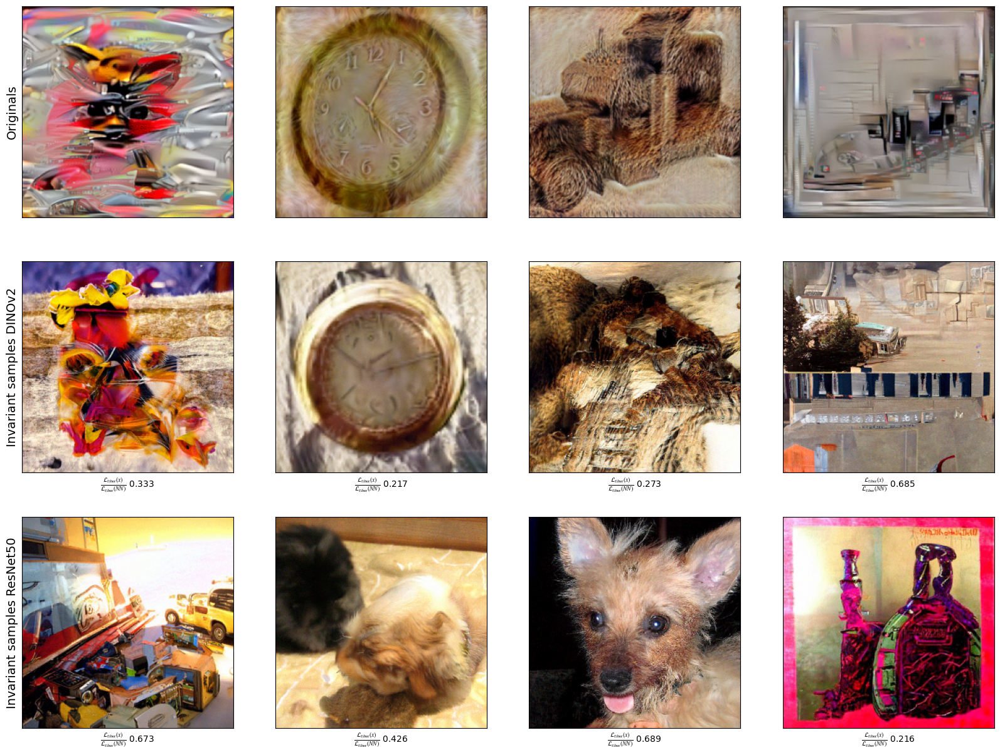

In [41]:
plt_nn = False
num_samples = 4
plot_indices = torch.randperm(len(orig))[:num_samples]
plots_per_col = 3 + plt_nn*2
plt.figure(figsize=(5*num_samples, 5*plots_per_col))

for i, ind in enumerate(plot_indices): 
    plt.subplot(plots_per_col, num_samples, i+1)
    plt.imshow(orig[ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    if i == 0:
        plt.ylabel("Originals", fontsize=14)
    plt.subplot(plots_per_col, num_samples, i+1+num_samples)
    min_fl_ind = torch.argmin(fiber_loss_dino[ind] + (~mask[ind])*torch.inf, dim=0)
    plt.imshow(inv_dino[ind, min_fl_ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(r"$\frac{\mathcal{L}_\text{fiber}(x)}{\mathcal{L}_\text{fiber}(NN)}$ %.3f" % (fiber_loss_dino[ind][min_fl_ind]/fiber_loss_nn_dino[ind], ))
    if i == 0:
        plt.ylabel("Invariant samples DINOv2", fontsize=14)
    plt.subplot(plots_per_col, num_samples, i+1+2*num_samples)
    min_fl_ind = torch.argmin(fiber_loss_resnet[ind] + (~mask[ind])*torch.inf, dim=0)
    plt.imshow(inv_resnet[ind, min_fl_ind].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(r"$\frac{\mathcal{L}_\text{fiber}(x)}{\mathcal{L}_\text{fiber}(NN)}$ %.3f" % (fiber_loss_resnet[ind][min_fl_ind]/fiber_loss_nn_resnet[ind], ))
    if i == 0:
        plt.ylabel("Invariant samples ResNet50", fontsize=14)
    if plt_nn:
        plt.subplot(plots_per_col, num_samples, i+1+3*num_samples)
        plt.imshow(orig[nn_indices_dino[ind]].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
        plt.xticks([])
        plt.yticks([])
        # plt.xlabel(r"$\mathcal{L}_\text{fiber}$ %.1f" % (fiber_loss_nn_dino[ind], ))
        if i == 0:
            plt.ylabel("Nearest Neighbor Dino", fontsize=14)
        plt.subplot(plots_per_col, num_samples, i+1+4*num_samples)
        plt.imshow(orig[nn_indices_resnet[ind]].permute(1, 2, 0).cpu().detach().numpy()/2 + 0.5)
        plt.xticks([])
        plt.yticks([])
        # plt.xlabel(r"$\mathcal{L}_\text{fiber}$ %.1f" % (fiber_loss_nn_resnet[ind], ))
        if i == 0:
            plt.ylabel("Nearest Neighbor ResNet", fontsize=14)
plt.show()

## Pretrained Classifier

In [10]:
pretrained_classifier = torchvision.models.convnext_large(weights=torchvision.models.ConvNeXt_Large_Weights.IMAGENET1K_V1).to(device)

In [11]:
import sys
sys.path.append("/home/hd/hd_hd/hd_gu452/texture-vs-shape/code")
# sys.path.append("/home/hd/hd_hd/hd_gu452/texture-vs-shape/code/helper")
from probabilities_to_decision import ImageNetProbabilitiesTo16ClassesMapping
from helper.human_categories import get_human_object_recognition_categories
import torch
import numpy as np
from typing import List, Union

class TorchImageNetProbabilitiesTo16Classes:
    def __init__(self, aggregation_function=np.mean, apply_softmax=False):
        """
        Parameters
        ----------
        aggregation_function : callable
            Function used to aggregate probabilities over ImageNet indices
            (default: np.mean, as in the original code).
        apply_softmax : bool
            If True, applies softmax to inputs before mapping.
            Set this to True if you pass logits instead of probabilities.
        """
        self.mapper = ImageNetProbabilitiesTo16ClassesMapping(
            aggregation_function=aggregation_function
        )
        self.apply_softmax = apply_softmax

    @torch.no_grad()
    def __call__(
        self,
        x: Union[torch.Tensor, np.ndarray]
    ) -> Union[str, List[str]]:
        """
        Parameters
        ----------
        x : torch.Tensor or np.ndarray
            Shape (1000,) or (B, 1000)

        Returns
        -------
        decision : str or List[str]
            One category if input is 1D, else a list of categories.
        """

        if isinstance(x, torch.Tensor):
            if self.apply_softmax:
                x = torch.softmax(x, dim=-1)

            x = x.detach().cpu().numpy()

        if x.ndim == 1:
            return self.mapper.probabilities_to_decision(x)

        elif x.ndim == 2:
            return [
                self.mapper.probabilities_to_decision(x[i])
                for i in range(x.shape[0])
            ]

        else:
            raise ValueError(f"Expected shape (1000,) or (B, 1000), got {x.shape}")


decision_fc = TorchImageNetProbabilitiesTo16Classes()
categories = get_human_object_recognition_categories()

In [15]:
def get_acc_from_categories(cat_list_1, cat_list_2):
    assert len(cat_list_1) == len(cat_list_2)
    agreement = [cat1 == cat2 for cat1, cat2 in zip(cat_list_1, cat_list_2)]
    agreement = torch.tensor(agreement, dtype=bool)
    return agreement.float().mean().item()

def get_acc_combined(cat_list_1, target_list_1, target_list_2):
    assert len(cat_list_1) == len(target_list_1) == len(target_list_2)
    agreement1 = [cat1 == cat2 for cat1, cat2 in zip(cat_list_1, target_list_1)]
    agreement2 = [cat1 == cat2 for cat1, cat2 in zip(cat_list_1, target_list_2)]
    agreement1 = torch.tensor(agreement1, dtype=bool)
    agreement2 = torch.tensor(agreement2, dtype=bool)
    return torch.logical_or(agreement1, agreement2).float().mean().item()



with torch.no_grad():
    logits_orig = pretrained_classifier(orig)
cat_shape = [categories[ind] for ind in inv_dict["shape_labels"]]
cat_texture = [categories[ind] for ind in inv_dict["texture_labels"]]
cat_orig = decision_fc(logits_orig.softmax(dim=1).cpu().detach().numpy())

acc_shape_orig = get_acc_from_categories(cat_shape, cat_orig)
acc_texture_orig = get_acc_from_categories(cat_texture, cat_orig)
acc_both_orig = get_acc_combined(cat_orig, cat_shape, cat_texture)

acc_shape_dino = []
acc_texture_dino = []
acc_both_dino = []

acc_shape_resnet = []
acc_texture_resnet = []
acc_both_resnet = []

for sample_set in range(inv_dino.shape[1]):    
    with torch.no_grad():
        logits_dino = pretrained_classifier(inv_dino[:, sample_set].to(device))
        logits_resnet = pretrained_classifier(inv_resnet[:, sample_set].to(device))
    cat_dino = decision_fc(logits_dino.softmax(dim=1).cpu().detach().numpy())
    cat_resnet = decision_fc(logits_resnet.softmax(dim=1).cpu().detach().numpy())
    acc_shape_dino.append(get_acc_from_categories(cat_shape, cat_dino))
    acc_texture_dino.append(get_acc_from_categories(cat_texture, cat_dino))
    acc_both_dino.append(get_acc_combined(cat_dino, cat_shape, cat_texture))

    acc_shape_resnet.append(get_acc_from_categories(cat_shape, cat_resnet))
    acc_texture_resnet.append(get_acc_from_categories(cat_texture, cat_resnet))
    acc_both_resnet.append(get_acc_combined(cat_resnet, cat_shape, cat_texture))


In [16]:
print([categories[ind] for ind in inv_dict["shape_labels"][:5]])
print([categories[ind] for ind in inv_dict["texture_labels"][:5]])
print(decision_fc(logits_orig[:5].softmax(dim=1).cpu().detach().numpy()))
print(decision_fc(logits_dino[:5].softmax(dim=1).cpu().detach().numpy()))
print(decision_fc(logits_resnet[:5].softmax(dim=1).cpu().detach().numpy()))

['boat', 'dog', 'car', 'keyboard', 'truck']
['truck', 'keyboard', 'knife', 'bicycle', 'bear']
['bottle', 'bottle', 'car', 'bicycle', 'bear']
['bird', 'bottle', 'car', 'chair', 'cat']
['keyboard', 'bottle', 'boat', 'knife', 'knife']


In [17]:
print(f"Shape accuracy on originals: {acc_shape_orig*100:.1f}%")
print(f"Texture accuracy on originals: {acc_texture_orig*100:.1f}%")
print(f"Combined accuracy on originals: {acc_both_orig*100:.1f}%")

print(f"Shape accuracy on dino: {np.mean(acc_shape_dino)*100:.1f} +- {np.std(acc_shape_dino)*100:.1f}%")
print(f"Texture accuracy on dino: {np.mean(acc_texture_dino)*100:.1f} +- {np.std(acc_texture_dino)*100:.1f}%")
print(f"Combined accuracy on dino: {np.mean(acc_both_dino)*100:.1f} +- {np.std(acc_both_dino)*100:.1f}%")

print(f"Shape accuracy on resnet: {np.mean(acc_shape_resnet)*100:.1f} +- {np.std(acc_shape_resnet)*100:.1f}%")
print(f"Texture accuracy on resnet: {np.mean(acc_texture_resnet)*100:.1f} +- {np.std(acc_texture_resnet)*100:.1f}%")
print(f"Combined accuracy on resnet: {np.mean(acc_both_resnet)*100:.1f} +- {np.std(acc_both_resnet)*100:.1f}%")

Shape accuracy on originals: 25.7%
Texture accuracy on originals: 55.7%
Combined accuracy on originals: 77.1%
Shape accuracy on dino: 35.1 +- 0.7%
Texture accuracy on dino: 18.4 +- 1.5%
Combined accuracy on dino: 50.3 +- 2.3%
Shape accuracy on resnet: 5.8 +- 1.5%
Texture accuracy on resnet: 8.4 +- 0.5%
Combined accuracy on resnet: 13.9 +- 1.5%


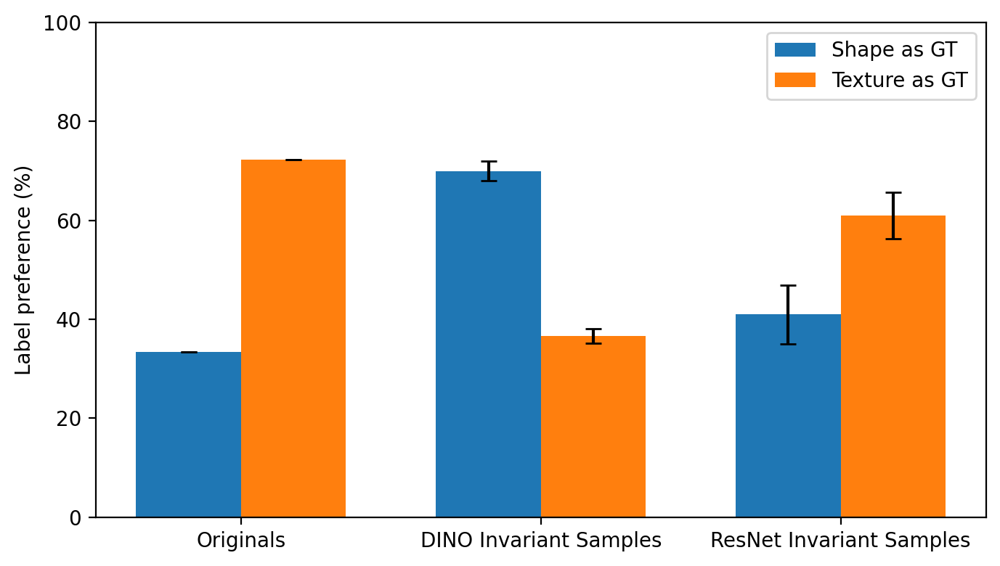

In [24]:
rel_acc_shape_orig = acc_shape_orig/acc_both_orig
rel_acc_texture_orig = acc_texture_orig/acc_both_orig
rel_acc_shape_dino = [sh/bo for sh, bo in zip(acc_shape_dino, acc_both_dino)]
rel_acc_texture_dino = [sh/bo for sh, bo in zip(acc_texture_dino, acc_both_dino)]
rel_acc_shape_resnet = [sh/bo for sh, bo in zip(acc_shape_resnet, acc_both_resnet)]
rel_acc_texture_resnet = [sh/bo for sh, bo in zip(acc_texture_resnet, acc_both_resnet)]

# Means
shape_means = [
    rel_acc_shape_orig * 100,
    np.mean(rel_acc_shape_dino) * 100,
    np.mean(rel_acc_shape_resnet) * 100,
]

texture_means = [
    rel_acc_texture_orig * 100,
    np.mean(rel_acc_texture_dino) * 100,
    np.mean(rel_acc_texture_resnet) * 100,
]

# Std devs (0 for originals)
shape_stds = [
    0.0,
    np.std(rel_acc_shape_dino) * 100,
    np.std(rel_acc_shape_resnet) * 100,
]

texture_stds = [
    0.0,
    np.std(rel_acc_texture_dino) * 100,
    np.std(rel_acc_texture_resnet) * 100,
]

labels = ["Originals", "DINO Invariant Samples", "ResNet Invariant Samples"]
x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(7, 4), dpi=200)

plt.bar(
    x - width / 2,
    shape_means,
    width,
    yerr=shape_stds,
    label="Shape as GT",
    capsize=4,
)

plt.bar(
    x + width / 2,
    texture_means,
    width,
    yerr=texture_stds,
    label="Texture as GT",
    capsize=4,
)

plt.xticks(x, labels)
plt.ylabel("Label preference (%)")
plt.ylim(0, 100)
plt.legend()
plt.tight_layout()
plt.show()


# FID computation

## Dino

In [6]:
def load_and_combine_sequential_samples(prefix_filter="sampled_imagenet_invariances_", root="/home/hd/hd_hd/hd_gu452/workspaces/gpfs/hd_gu452-imagenet"):
    combined_dict = {
        "invariances": [],
        "originals": [],
        "labels": [],
        "invariances_embeddings": [],
        "original_embeddings": [],
    }
    
    for foldername in tqdm(os.listdir(root)):
        if foldername.startswith(prefix_filter):
            results_dict = {
                            "invariances": [],
                            "originals": [],
                            "labels": [],
                            "invariances_embeddings": [],
                            "original_embeddings": [],
                           }
            for fname in os.listdir(os.path.join(root, foldername)):
                if "chunk_" in fname:
                    chunk_dict = torch.load(os.path.join(root, foldername, fname))
                    for key in results_dict.keys():
                        results_dict[key].append(chunk_dict[key])
            for key in results_dict.keys():
                combined_dict[key].append(torch.cat(results_dict[key], dim=0))
    # Check difference:
    for last_orig, next_orig in zip(combined_dict["originals"][:-1], combined_dict["originals"][1:]):
        min_len = min(len(last_orig), len(next_orig))
        assert torch.all(((last_orig[:min_len] - next_orig[:min_len])**2).sum(dim=(1, 2, 3)) > 1.e-4), "Detected duplications"
        
    for key in combined_dict.keys():
        combined_dict[key] = torch.cat(combined_dict[key], dim=0)

    return combined_dict

In [7]:
sequential_dict = load_and_combine_sequential_samples(prefix_filter="sampled_imagenet_invariances_")

100%|██████████| 48/48 [00:14<00:00,  3.39it/s]


In [18]:
fid = compute_fid(sequential_dict["originals"], sequential_dict["invariances"])

I0000 00:00:1768138388.987825 2956349 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22592 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:01:00.0, compute capability: 8.6
100%|██████████| 157/157 [00:14<00:00, 11.10it/s]


warming up TensorFlow...
computing reference batch activations...
computing/reading reference batch statistics...
computing sample batch activations...
computing/reading sample batch statistics...
Computing evaluations...
Inception Score: 78.45274353027344
FID: 28.344033358387264
sFID: 46.21432962568133
Precision: 0.5929
Recall: 0.8317



In [19]:
fid

(78.45274353027344, 28.344033358387264, 46.21432962568133, 0.5929, 0.8317)

In [8]:
compute_fid_alternative(sequential_dict["originals"].to(device), sequential_dict["invariances"].to(device), batch_size=512)

29.68411614293528

## Inception Net

In [7]:
def load_and_combine_sequential_samples(prefix_filter="sampled_imagenet_invariances_", root="/home/hd/hd_hd/hd_gu452/workspaces/gpfs/hd_gu452-imagenet"):
    combined_dict = {
        "invariances": [],
        "originals": [],
        "labels": [],
        "invariances_embeddings": [],
        "original_embeddings": [],
    }
    
    for foldername in tqdm(os.listdir(root)):
        if foldername.startswith(prefix_filter):
            results_dict = {
                            "invariances": [],
                            "originals": [],
                            "labels": [],
                            "invariances_embeddings": [],
                            "original_embeddings": [],
                           }
            for fname in os.listdir(os.path.join(root, foldername)):
                if "chunk_" in fname:
                    chunk_dict = torch.load(os.path.join(root, foldername, fname))
                    for key in results_dict.keys():
                        results_dict[key].append(chunk_dict[key])
            for key in results_dict.keys():
                combined_dict[key].append(torch.cat(results_dict[key], dim=0))
    # Check difference:
    for last_orig, next_orig in zip(combined_dict["originals"][:-1], combined_dict["originals"][1:]):
        min_len = min(len(last_orig), len(next_orig))
        assert torch.all(((last_orig[:min_len] - next_orig[:min_len])**2).sum(dim=(1, 2, 3)) > 1.e-4), "Detected duplications"
        
    for key in combined_dict.keys():
        combined_dict[key] = torch.cat(combined_dict[key], dim=0)

    return combined_dict

In [8]:
sequential_dict = load_and_combine_sequential_samples(prefix_filter="sampled_inception_invariances_")

100%|██████████| 49/49 [00:21<00:00,  2.24it/s]


In [9]:
fid = compute_fid(sequential_dict["originals"], sequential_dict["invariances"])

I0000 00:00:1768138009.526995 2956349 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22592 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:01:00.0, compute capability: 8.6
I0000 00:00:1768138009.819674 2956349 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22592 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:01:00.0, compute capability: 8.6
2026-01-11 14:26:50.288908: W tensorflow/core/framework/op_def_util.cc:370] Op BatchNormWithGlobalNormalization is deprecated. It will cease to work in GraphDef version 9. Use tf.nn.batch_normalization().
  0%|          | 0/1 [00:00<?, ?it/s]I0000 00:00:1768138010.631938 2956349 mlir_graph_optimization_pass.cc:437] MLIR V1 optimization pass is not enabled
2026-01-11 14:26:53.860386: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91002
100%|██████████| 157/157 [00:13<00:00, 12.04it/s]


warming up TensorFlow...
computing reference batch activations...
computing/reading reference batch statistics...
computing sample batch activations...
computing/reading sample batch statistics...
Computing evaluations...
Inception Score: 47.65608215332031
FID: 33.516096906527764
sFID: 44.16355814074279
Precision: 0.5998
Recall: 0.7592



In [10]:
fid

(47.65608215332031, 33.516096906527764, 44.16355814074279, 0.5998, 0.7592)

In [13]:
compute_fid_alternative(sequential_dict["originals"].to(device), sequential_dict["invariances"].to(device), batch_size=512)

3.8065391873628336